# <span style='color:Blue'> Predict probability whether a given ticket will be paid?</span>

Blight violations in the city of Detroit has been an dificult problem to solve. Every year, the city of Detroit issues millions of dollars in fines to residents and every year, many of these fines remain unpaid. Enforcing unpaid blight fines is a costly and tedious process, so the city wants to know: how can we increase blight ticket compliance?<br>

Blighted property shall include commercial or residential structures, which have been declared uninhabitable and hazardous by the City and exhibit objectively determinable signs of deterioration that constitute a threat to human health, safety and public welfare.

In this notebook, I will focus on the problem at hand, helping the city enforce fines by predicting whether a person is going to comply with a property maintenance fine or not.

The first step in answering this question is understanding when and why a resident might fail to comply with a blight ticket. This is where predictive modeling comes in. For this assignment, your task is to predict whether a given blight ticket will be paid on time.


<div style="width:100%;text-align: center;"> <img src= "https://www.ft.com/__origami/service/image/v2/images/raw/http%3A%2F%2Fcom.ft.imagepublish.upp-prod-eu.s3.amazonaws.com%2F4b7221a4-9f64-11e5-beba-5e33e2b79e46?fit=scale-down&source=next&width=700" width="650px"/> </div>




### The Dataset
I have two data files for use in training and validating my models: train.csv and test.csv. Each row in these two files corresponds to a single blight ticket, and includes information about when, why, and to whom each ticket was issued. 

The target variable is compliance, which is True if the ticket was paid early, on time, or within one month of the hearing data, False if the ticket was paid after the hearing date or not at all, and Null if the violator was found not responsible. 

Note: All tickets where the violators were found not responsible are not considered during evaluation. They are included in the training set as an additional source of data for visualization, and to enable unsupervised and semi-supervised approaches. However, they are not included in the test set.

<br>

**File descriptions** (used for training model!)

    train.csv - the training set (all tickets issued 2004-2011)
    test.csv - the test set (all tickets issued 2012-2016)
    addresses.csv & latlons.csv - mapping from ticket id to addresses, and from addresses to lat/lon coordinates. 
     Note: misspelled addresses may be incorrectly geolocated.

<br>

**Data fields**

train.csv & test.csv

    ticket_id - unique identifier for tickets
    agency_name - Agency that issued the ticket
    inspector_name - Name of inspector that issued the ticket
    violator_name - Name of the person/organization that the ticket was issued to
    violation_street_number, violation_street_name, violation_zip_code - Address where the violation occurred
    mailing_address_str_number, mailing_address_str_name, city, state, zip_code, non_us_str_code, country - Mailing address of the violator
    ticket_issued_date - Date and time the ticket was issued
    hearing_date - Date and time the violator's hearing was scheduled
    violation_code, violation_description - Type of violation
    disposition - Judgment and judgement type
    fine_amount - Violation fine amount, excluding fees
    admin_fee - $20 fee assigned to responsible judgments
state_fee - $10 fee assigned to responsible judgments
    late_fee - 10% fee assigned to responsible judgments
    discount_amount - discount applied, if any
    clean_up_cost - DPW clean-up or graffiti removal cost
    judgment_amount - Sum of all fines and fees
    grafitti_status - Flag for graffiti violations
    
train.csv only

    payment_amount - Amount paid, if any
    payment_date - Date payment was made, if it was received
    payment_status - Current payment status as of Feb 1 2017
    balance_due - Fines and fees still owed
    collection_status - Flag for payments in collections
    compliance [target variable for prediction] 
     Null = Not responsible
     0 = Responsible, non-compliant
     1 = Responsible, compliant
    compliance_detail - More information on why each ticket was marked compliant or non-compliant


___
### Evaluation

The predictions are given as the probability that the corresponding blight ticket will be paid on time.

The evaluation metric for this assignment is the Area Under the ROC Curve (AUC). 

## Import Libraries

In [1]:
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings("ignore")
# Importing re package
import re

import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import GridSearchCV

In [3]:
%matplotlib inline

class color:
   BLUE = '\033[94m'
   PURPLE = '\033[95m'
   RED = '\033[91m'
   BOLD = '\033[1m'
   END = '\033[0m'

## Load Test Train Data 

In [4]:
train_data = pd.read_csv('train.csv', encoding = 'ISO-8859-1')
test_data = pd.read_csv('test.csv', encoding = 'ISO-8859-1')

# <span style='color:Blue'> Data Overview  </span>

Let us look at the data.

In [5]:
def overview(df):
    print(color.BOLD + "There are {} rows and {} columns in the dataset.".format(df.shape[0],df.shape[1]),"\n"+ color.END)
    print(color.BOLD +color.BLUE +"Let's look at the data types available in the dataset"+ color.END)
    df.info()

In [6]:
overview(train_data)
print(color.BOLD +color.BLUE +"\n","Summary statistics of dataset"+ color.END)
train_data.describe()

There are 250306 rows and 34 columns in the dataset. 

Let's look at the data types available in the dataset
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 250306 entries, 0 to 250305
Data columns (total 34 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   ticket_id                   250306 non-null  int64  
 1   agency_name                 250306 non-null  object 
 2   inspector_name              250306 non-null  object 
 3   violator_name               250272 non-null  object 
 4   violation_street_number     250306 non-null  float64
 5   violation_street_name       250306 non-null  object 
 6   violation_zip_code          0 non-null       float64
 7   mailing_address_str_number  246704 non-null  float64
 8   mailing_address_str_name    250302 non-null  object 
 9   city                        250306 non-null  object 
 10  state                       250213 non-null  object 
 11  zip_code             

,ticket_id,violation_street_number,violation_zip_code,mailing_address_str_number,fine_amount,admin_fee,state_fee,late_fee,discount_amount,clean_up_cost,judgment_amount,payment_amount,balance_due,compliance
count,250306.000000,2.503060e+05,0.0,2.467040e+05,250305.000000,250306.000000,250306.000000,250306.000000,250306.000000,250306.0,250306.000000,250306.000000,250306.000000,159880.000000
mean,152665.543099,1.064986e+04,NaN,9.149788e+03,374.423435,12.774764,6.387382,21.494506,0.125167,0.0,268.685356,48.898986,222.449058,0.072536
std,77189.882881,3.188733e+04,NaN,3.602034e+04,707.195807,9.607344,4.803672,56.464263,3.430178,0.0,626.915212,222.422425,606.394010,0.259374
min,18645.000000,0.000000e+00,NaN,1.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,-7750.000000,0.000000
25%,86549.250000,4.739000e+03,NaN,5.440000e+02,200.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000
50%,152597.500000,1.024400e+04,NaN,2.456000e+03,250.000000,20.000000,10.000000,10.000000,0.000000,0.0,140.000000,0.000000,25.000000,0.000000
75%,219888.750000,1.576000e+04,NaN,1.292725e+04,250.000000,20.000000,10.000000,25.000000,0.000000,0.0,305.000000,0.000000,305.000000,0.000000
max,366178.000000,1.415411e+07,NaN,5.111345e+06,10000.000000,20.000000,10.000000,1000.000000,350.000000,0.0,11030.000000,11075.000000,11030.000000,1.000000


In [7]:
overview(test_data)
print(color.BOLD +color.BLUE +"\n","Summary statistics of dataset"+ color.END)
test_data.describe()

There are 61001 rows and 27 columns in the dataset. 

Let's look at the data types available in the dataset
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61001 entries, 0 to 61000
Data columns (total 27 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ticket_id                   61001 non-null  int64  
 1   agency_name                 61001 non-null  object 
 2   inspector_name              61001 non-null  object 
 3   violator_name               60973 non-null  object 
 4   violation_street_number     61001 non-null  float64
 5   violation_street_name       61001 non-null  object 
 6   violation_zip_code          24024 non-null  object 
 7   mailing_address_str_number  59987 non-null  object 
 8   mailing_address_str_name    60998 non-null  object 
 9   city                        61000 non-null  object 
 10  state                       60670 non-null  object 
 11  zip_code                    60998 non

,ticket_id,violation_street_number,non_us_str_code,fine_amount,admin_fee,state_fee,late_fee,discount_amount,clean_up_cost,judgment_amount
count,61001.000000,6.100100e+04,0.0,61001.000000,61001.0,61001.0,61001.000000,61001.000000,61001.000000,61001.000000
mean,331724.532811,1.256638e+04,NaN,272.714185,20.0,10.0,25.116219,0.239340,20.649711,347.895541
std,25434.932141,1.414373e+05,NaN,360.101855,0.0,0.0,36.310155,3.245894,242.375180,460.058043
min,284932.000000,-1.512600e+04,NaN,0.000000,20.0,10.0,0.000000,0.000000,0.000000,0.000000
25%,310111.000000,6.008000e+03,NaN,50.000000,20.0,10.0,5.000000,0.000000,0.000000,85.000000
50%,332251.000000,1.213400e+04,NaN,200.000000,20.0,10.0,10.000000,0.000000,0.000000,250.000000
75%,353031.000000,1.716500e+04,NaN,250.000000,20.0,10.0,25.000000,0.000000,0.000000,305.000000
max,376698.000000,2.010611e+07,NaN,10000.000000,20.0,10.0,1000.000000,250.000000,15309.000000,15558.800000


# <span style='color:Blue'> Load Address Data and Create a map with property location</span>

In [8]:
from geopy.geocoders import Nominatim
from folium.plugins import HeatMap
import folium
from tqdm import tqdm

In [9]:
#load datasets
addresses =  pd.read_csv('addresses.csv')
lat_lons = pd.read_csv('latlons.csv')

In [10]:
#join datasets
id_address= addresses.set_index('address').join(lat_lons.set_index('address')).reset_index().set_index('ticket_id')

In [11]:
print(color.BOLD + "There are {} rows and {} columns in the dataset.".format(id_address.shape[0],id_address.shape[1]),"\n"+ color.END)

There are 311307 rows and 3 columns in the dataset. 



In [12]:
print(color.BOLD +color.BLUE +"\n","Summary statistics of dataset"+ color.END)
id_address.describe()


 Summary statistics of dataset


,lat,lon
count,311299.000000,311299.000000
mean,42.389822,-83.112668
std,0.038155,0.095320
min,41.785926,-88.081348
25%,42.364200,-83.188845
50%,42.393794,-83.126422
75%,42.419709,-83.036160
max,45.809387,-82.433593


In [13]:
address_locations=pd.DataFrame(id_address['address'].value_counts().reset_index())
address_locations.columns=['address','count']

In [14]:
address_locations=address_locations.merge(id_address,on='address',how="left").dropna()
address_locations['count'].max()

203

In [15]:
def defaultmap(default_location=[42.3314, -83.0458], default_zoom_start=9):
    base_map = folium.Map(location=default_location, control_scale=True, zoom_start=default_zoom_start)
    return base_map

In [16]:
basemap=defaultmap()
HeatMap(address_locations[['lat','lon','count']].values.tolist(),zoom=20,radius=15).add_to(basemap)

In [17]:
basemap

## <span style='color:Maroon'> Remove train only columns from train dataset </span>

In [18]:
train_only_columns = ['payment_amount', 'payment_date', 'payment_status', 'balance_due','collection_status', 'compliance_detail']
train_data.drop(train_only_columns, axis=1, inplace=True)

## <span style='color:Maroon'> get the unique values form variaous categorical variables from both test and train datasets
 </span>

In [19]:
def uniqueplot(df):
    data_ = df.select_dtypes(exclude=['int', 'float'])
    df_variable_unique_levels_=(pd.DataFrame(data_.nunique())).reset_index().rename(columns={'index':'Variable', 0:'Unique_Levels'})
    df_variable_unique_levels_.sort_values('Unique_Levels',ascending=False, inplace=True)

    # Create just a figure and only one subplot
    fig, ax = plt.subplots(figsize=(10,10))

    ax = sns.barplot(x="Variable", y="Unique_Levels", data=df_variable_unique_levels_)

    # rotates labels and aligns them horizontally to left 
    plt.setp( ax.xaxis.get_majorticklabels(), rotation=90, ha="left" )

    plt.tight_layout()
    plt.show()

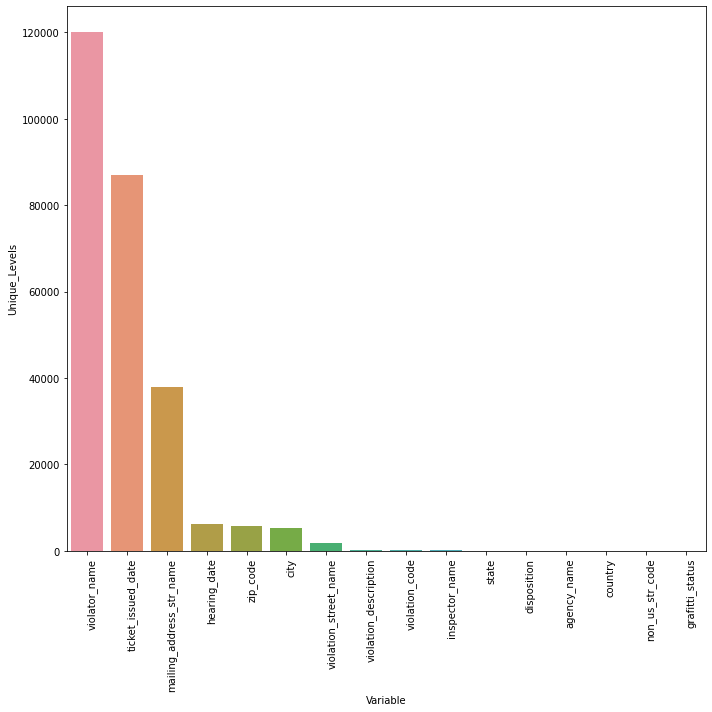

In [20]:
### Train Data
uniqueplot(train_data)

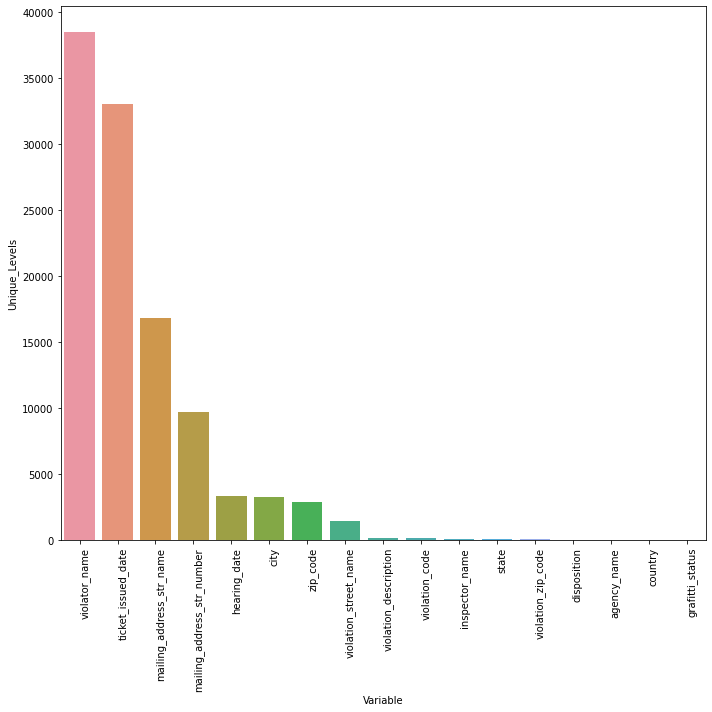

In [21]:
### Test Data
uniqueplot(test_data)

variables such as inspector_name, violator_name, violation_street_name, mailing_address_str_name, city, state, zip_code, country, violation_code, violation_description, have too many unique values. <br>
These might not provide any useful information, so we can delete these columns. But before that we can use the necessary information from these columns to convert them into required and delete them.

## <span style='color:Maroon'> Remove variables with too many unique values </span>
Drop inspector_name, violator_name, violation_street_name, mailing_address_str_name, zip_code, violation_description from test and train

In [22]:
# Remove column name from both test and train
cols_del=['inspector_name', 'violator_name', 'violation_street_name', 'mailing_address_str_name', 'zip_code', 'violation_description']
train_data.drop(cols_del, axis=1, inplace=True)
test_data.drop(cols_del, axis=1, inplace=True)

# <span style='color:Blue'> Feature Engineering  </span>

## <span style='color:Maroon'> Convert Categorical variables to Binary Variables</span>

In [23]:
def converttobinary(df):
    print(color.BOLD +color.BLUE +"\n","country Column","\n"+ color.END)
    print(color.BOLD +color.PURPLE +"If the violator statying is within country USA or not, If the violator is statying within USA 1 else 0"+ color.END)
    print(color.BLUE +"Unique values in country column"+ color.END)
    country_df_valcounts_=pd.DataFrame(df["country"].value_counts()).rename(columns={'country':'Total Rows'})
    print(country_df_valcounts_)
    print(color.RED +"There are {} unique values in country column".format(country_df_valcounts_.count()[0])+ color.END)
    df = df[df.country == 'USA']
    df['USA'] = df['country'].apply(lambda x: 1 if 'USA' else 0)
    
    print(color.BOLD +color.BLUE +"\n","city Column","\n"+ color.END)
    print(color.BOLD +color.PURPLE +"If the violator is statying within city detriot, MI or not, If the violator is statying within city detriot 1 else 0"+ color.END)
    df['within_Detriot'] = np.where((df.state == 'MI' ) & (df['city'].str.findall('det', flags=re.IGNORECASE)), 1, 0)
    
    print(color.BOLD +color.BLUE +"\n","state Column","\n"+ color.END)
    print(color.BOLD +color.PURPLE +"If the violator is statying within state, MI or not, if the violator is statying within state 1 else 0"+ color.END)
    df['MI'] = np.where((df.state == 'MI' ), 1, 0)



In [24]:
## Train data
converttobinary(train_data)


 country Column 

If the violator statying is within country USA or not, If the violator is statying within USA 1 else 0
Unique values in country column
      Total Rows
USA       250293
Cana           7
Aust           3
Egyp           2
Germ           1
There are 5 unique values in country column

 city Column 

If the violator is statying within city detriot, MI or not, If the violator is statying within city detriot 1 else 0

 state Column 

If the violator is statying within state, MI or not, if the violator is statying within state 1 else 0


In [25]:
## Test data
converttobinary(test_data)
print("\n")
print("Drop country, city,state column from test and train data")


 country Column 

If the violator statying is within country USA or not, If the violator is statying within USA 1 else 0
Unique values in country column
     Total Rows
USA       61001
There are 1 unique values in country column

 city Column 

If the violator is statying within city detriot, MI or not, If the violator is statying within city detriot 1 else 0

 state Column 

If the violator is statying within state, MI or not, if the violator is statying within state 1 else 0


Drop country, city,state column from test and train data


In [26]:
### get the top 10 violation codes and if the violation is in top 10 then 1 or else 0 for both test and train data.
print(color.BOLD +color.BLUE +"\n","violation codes Column","\n"+ color.END)
    
# train data 
top10_violation_types = train_data.violation_code.value_counts().index[0:10]
train_data['top10_violation_types'] = [1 if c in top10_violation_types else 0 for c in train_data.violation_code]

# test data 
test_data['top10_violation_types'] = [1 if c in top10_violation_types else 0 for c in test_data.violation_code]


 violation codes Column 



## <span style='color:Maroon'>Drop unwanted columns </span>
### Drop country, city, state column from test and train data

In [27]:
delete_columns=['country', 'city', 'state','violation_code']
train_data.drop(delete_columns, axis=1, inplace=True)
test_data.drop(delete_columns, axis=1, inplace=True)

## <span style='color:Maroon'> Drop columns nan_columns  </span>

In [28]:
#Pandas will recognize both empty cells and “NA” types as missing values. 
# there are many empty rows in grafitti_status we can delete the column
nan_columns=[ 'violation_street_number', 'violation_zip_code', 'mailing_address_str_number', 'non_us_str_code', 'violation_zip_code', 'non_us_str_code', 'grafitti_status']
train_data.drop(nan_columns, axis=1, inplace=True)
test_data.drop(nan_columns, axis=1, inplace=True)

## <span style='color:Maroon'> More EDA </span>

### agency_name  

In [29]:
agency_train_valcounts_=pd.DataFrame(train_data["agency_name"].value_counts()).rename(columns={'agency_name':'Total Rows'})
agency_train_valcounts_

,Total Rows
"Buildings, Safety Engineering & Env Department",157784
Department of Public Works,74717
Health Department,8903
Detroit Police Department,8900
Neighborhood City Halls,2


In [30]:
agency_test_valcounts_=pd.DataFrame(test_data["agency_name"].value_counts()).rename(columns={'agency_name':'Total Rows'})
agency_test_valcounts_

,Total Rows
Department of Public Works,40731
"Buildings, Safety Engineering & Env Department",16832
Detroit Police Department,3438


In [31]:
agency_compliance_=pd.crosstab(train_data.agency_name, train_data.compliance)

In [32]:
agency_compliance_

compliance,0.0,1.0
agency_name,,
"Buildings, Safety Engineering & Env Department",90040,5823
Department of Public Works,47727,4718
Detroit Police Department,3876,588
Health Department,6639,468
Neighborhood City Halls,1,0


In [33]:
pd.merge(agency_compliance_, agency_train_valcounts_, left_index=True, right_index=True).reset_index().rename(columns={'index':'Agency_Name', 0.0:'Non_Compliant_0', 1.0:'Compliant_1'})

,Agency_Name,Non_Compliant_0,Compliant_1,Total Rows
0,"Buildings, Safety Engineering & Env Department",90040,5823,157784
1,Department of Public Works,47727,4718,74717
2,Detroit Police Department,3876,588,8900
3,Health Department,6639,468,8903
4,Neighborhood City Halls,1,0,2


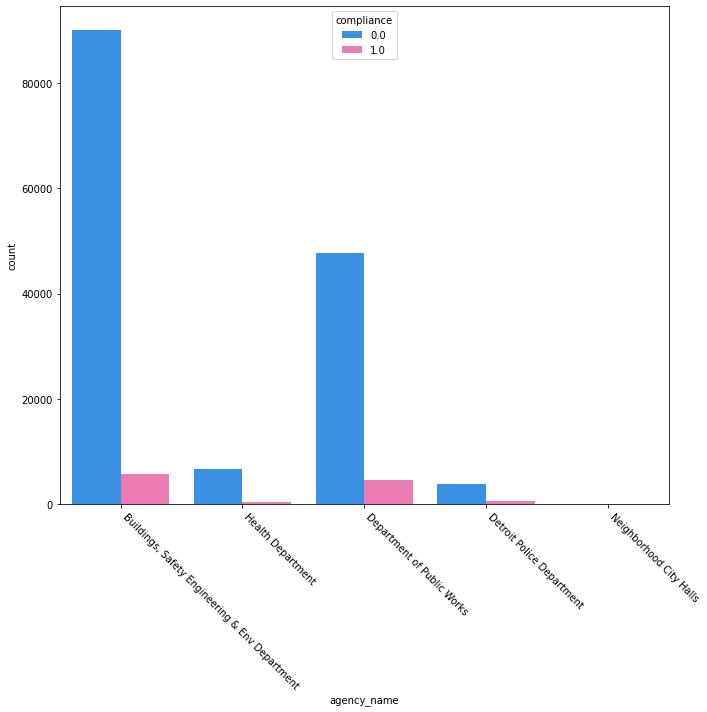

In [34]:
# Create just a figure and only one subplot
fig, ax = plt.subplots(figsize=(10,10))

color= ['dodgerblue', 'hotpink']
sns.countplot(hue ='compliance', x = "agency_name", data = train_data, palette=color)

# rotates labels and aligns them horizontally to left 
plt.setp( ax.xaxis.get_majorticklabels(), rotation=-45, ha="left" )

plt.tight_layout()
plt.show()

Through there are only three unique agency_names test data, from the train data it can be observed that by deleting the agency_names that are not in test data we might loose some information regarding the target variable. Particularly for Health Department, but there is one row in Neighborhood City Halls which is not compliant, we can delete those corresponding to Neighborhood City Hall from test data

In [35]:
delete_list=['Neighborhood City Halls']

train_data = train_data[~train_data['agency_name'].isin(delete_list)]

### disposition

In [36]:
disposition_train_valcounts_=pd.DataFrame(train_data["disposition"].value_counts()).rename(columns={'disposition':'Total Rows'})
disposition_train_valcounts_

,Total Rows
Responsible by Default,138340
Not responsible by Dismissal,48694
Not responsible by City Dismissal,34401
Responsible by Admission,13701
Responsible by Determination,7643
Not responsible by Determination,6639
PENDING JUDGMENT,387
SET-ASIDE (PENDING JUDGMENT),304
Responsible (Fine Waived) by Deter,195


In [37]:
disposition_test_valcounts_=pd.DataFrame(test_data["disposition"].value_counts()).rename(columns={'disposition':'Total Rows'})
disposition_test_valcounts_

,Total Rows
Responsible by Default,51602
Responsible by Admission,4484
Responsible by Determination,4124
Responsible (Fine Waived) by Deter,781
Responsible - Compl/Adj by Default,6
Responsible - Compl/Adj by Determi,2
Responsible (Fine Waived) by Admis,1
Responsible by Dismissal,1


In the train data there are some more columns where the disposition is under not responsible, we can delete the 

In [38]:
disposition_compliance_=pd.crosstab(train_data.disposition, train_data.compliance)
disposition_compliance_

compliance,0.0,1.0
disposition,,
Responsible (Fine Waived) by Deter,0,195
Responsible by Admission,9933,3768
Responsible by Default,133055,5285
Responsible by Determination,5294,2349


looking at the disposition and compliance cross tab we can usderstand that Responsible by Determination, Responsible by Default, Responsible by Admission, Responsible (Fine Waived) by Deter are most important. We can delete those where it is not responsible.

In [39]:
delete_list=['Not responsible by Dismissal', 'Not responsible by City Dismissal', 'Not responsible by Determination',
             'PENDING JUDGMENT','SET-ASIDE (PENDING JUDGMENT)']

train_data = train_data[~train_data['disposition'].isin(delete_list)]

after deletion do one hot encoding for remaining under disposition and drop the columns Responsible - Compl/Adj by Default,Responsible - Compl/Adj by Determi,Responsible (Fine Waived) by Admis,Responsible by Dismissal from the test data

## <span style='color:Maroon'> Relation between numeric variables </span>
* state_fee and admin_fee is same irrespective of compliance hence-ignore those columns

* clean_up_cost is mostly 0-ignore the column

* discount_amount there are very few rows with discount amount-ignore that column

* judgment_amount is sum of fine amount and other fee-ignore that column

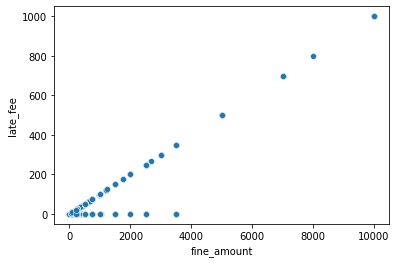

,fine_amount,late_fee
fine_amount,1.000000,0.986787
late_fee,0.986787,1.000000


In [40]:
sns.scatterplot(data=train_data, x="fine_amount", y="late_fee")

plt.show() 

corr_val = train_data[['fine_amount','late_fee']].corr()
corr_val


there is high correlation between the fine_amount and late fee, based on the correlation either of fine_amount and late_fee will be used for the model building

### fine_amount

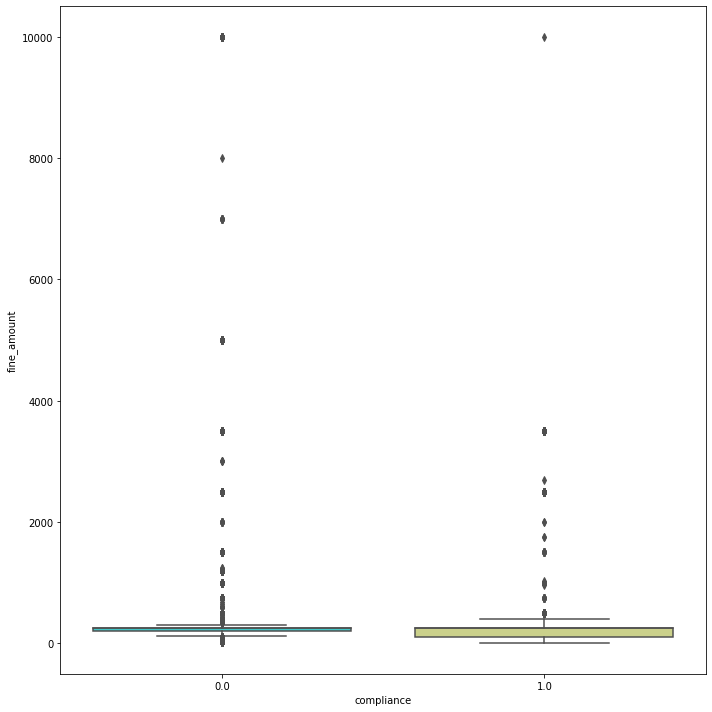

In [41]:
# Create just a figure and only one subplot
fig, ax = plt.subplots(figsize=(10,10))

sns.boxplot(x='compliance',y='fine_amount',data=train_data, palette='rainbow')

plt.tight_layout()
plt.show()

In [42]:
#Perform mean and median fine_amount
fine_amount_agg = train_data.groupby('compliance').fine_amount.agg(['mean','median','std','var']).reset_index()
fine_amount_agg

,compliance,mean,median,std,var
0,0.0,366.315008,250.0,693.570453,481039.972606
1,1.0,238.327240,250.0,357.343654,127694.486989


there is a significant difference between the means of the fine amount between compliant and non compliant 

### Late fee

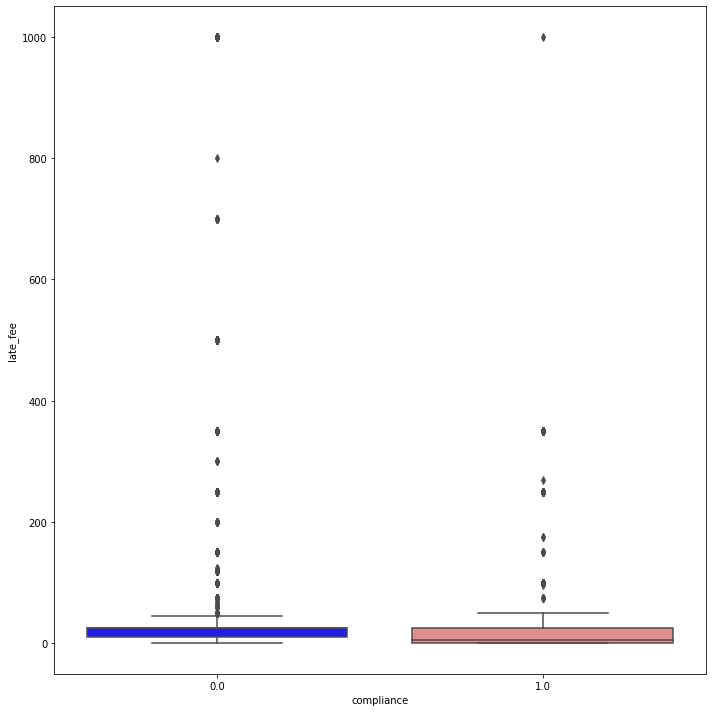

In [43]:
# Create just a figure and only one subplot
fig, ax = plt.subplots(figsize=(10,10))

colors=['blue','lightcoral']
sns.boxplot(x='compliance',y='late_fee',data=train_data, palette=colors)

plt.tight_layout()
plt.show()

In [44]:
#Perform mean and median late_fee
late_fee_agg = train_data.groupby('compliance').late_fee.agg(['mean','median','std','var']).reset_index()
late_fee_agg

,compliance,mean,median,std,var
0,0.0,35.26124,25.0,69.498911,4830.098653
1,1.0,13.06343,5.0,30.942405,957.432434


there is a significant difference between the means of the late fee between compliant and non compliant 

## <span style='color:Maroon'> Detecting Multicollinearity with VIF</span>

Multicollinearity occurs when there are two or more independent variables in a multi regression model, which have a high correlation among themselves. When some features are highly correlated, we might have difficulty in distinguishing between their individual effects on the target variable.

In VIF method, we pick each feature and regress it against all of the other features. For each regression, the factor is calculated as :

VIF=\frac{1}{1-R^2}

Where, R-squared is the coefficient of determination in linear regression. Its value lies between 0 and 1.

As we see from the formula, greater the value of R-squared, greater is the VIF. Hence, greater VIF denotes greater correlation. This is in agreement with the fact that a higher R-squared value denotes a stronger collinearity. Generally, a VIF above 5 indicates a high multicollinearity. 

### Dont consider for VIF
* dependent variable('compliance'), and columns ticket_id, ticket_issued_date, hearing_date

* clean_up_cost as there are more nan in the column

* agency_name, disposition as they are categorical variables


In [45]:
training_vif= train_data.drop(['compliance', 'ticket_id', 'ticket_issued_date', 'hearing_date', 'clean_up_cost', 'agency_name', 'disposition'], axis='columns')

# VIF dataframe

from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_data = pd.DataFrame()
vif_data["feature"] = training_vif.columns
  
# calculating VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(training_vif.values, i)
                   for i in range(len(training_vif.columns))]
  
print(vif_data)

                 feature            VIF
0            fine_amount  416652.246629
1              admin_fee       0.000000
2              state_fee       0.000000
3               late_fee    4221.034608
4        discount_amount       1.171671
5        judgment_amount  464586.439750
6  top10_violation_types       1.000398


* as mentioined judgment_amount is sum of fine_amount and other fee, we can expect multicollinearity with other variables.
This is reflecting thtrough vif study

* judgment_amount has a very high vif, hence we calculate the vif for other variables again after removing the vaiable

* after removing judgment_amount vif for other variables has reduced significantly

* as seen earlier, there is high correlation between fie_amount and late_fee

* in the second iteration we remove the late_fee and check the vif again for rest of the variables.

* Drop judgement_amount and fine_amount

In [46]:
training_vif_itr= training_vif.drop(['judgment_amount', 'late_fee'], axis='columns')

vif_data_itr = pd.DataFrame()
vif_data_itr["feature"] = training_vif_itr.columns
  
# calculating VIF for each feature
vif_data_itr["VIF"] = [variance_inflation_factor(training_vif_itr.values, i)
                     for i in range(len(training_vif_itr.columns))]
  
print(vif_data_itr)
# vif after dropping two variables judgement_fee and late_fee
# this is final patch after checking the vif individually.

                 feature       VIF
0            fine_amount  1.001959
1              admin_fee  0.000000
2              state_fee  0.000000
3        discount_amount  1.001603
4  top10_violation_types  1.000385


## <span style='color:Maroon'>checking the dfs' is there are any more null</span>

In [47]:
# printing column name where null is present
print()
print("printing column name where null is present")
col_name = train_data.isnull().any()
print(col_name)


printing column name where null is present
ticket_id                False
agency_name              False
ticket_issued_date       False
hearing_date              True
disposition              False
fine_amount              False
admin_fee                False
state_fee                False
late_fee                 False
discount_amount          False
clean_up_cost            False
judgment_amount          False
compliance               False
top10_violation_types    False
dtype: bool


In [48]:
# printing column name where null is present
print()
print("printing column name where null is present")
col_name = test_data.isnull().any()
print(col_name)


printing column name where null is present
ticket_id                False
agency_name              False
ticket_issued_date       False
hearing_date              True
disposition              False
fine_amount              False
admin_fee                False
state_fee                False
late_fee                 False
discount_amount          False
clean_up_cost            False
judgment_amount          False
top10_violation_types    False
dtype: bool


## <span style='color:Maroon'>convert the dates to usable manner</span>

In [49]:
from datetime import date
train_data[['ticket_issued_date','hearing_date']] = train_data[['ticket_issued_date','hearing_date']].apply(pd.to_datetime)
test_data[['ticket_issued_date','hearing_date']] = test_data[['ticket_issued_date','hearing_date']].apply(pd.to_datetime) 

# forward fill to fill the gaps in hearing date
train_data.hearing_date.fillna(method='ffill', inplace=True)
test_data.hearing_date.fillna(method='ffill', inplace=True)

In [50]:
# we take the difference between the ticket_issued_date and hearing_date in number of days
train_data['ticket_hearing_gap'] = (train_data['hearing_date'] - train_data['ticket_issued_date']).dt.days

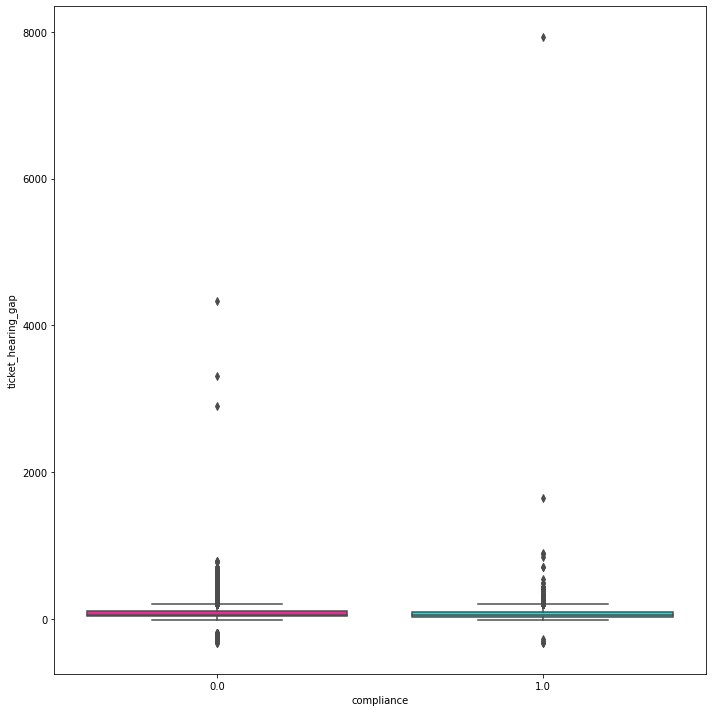

In [51]:
# Create just a figure and only one subplot
fig, ax = plt.subplots(figsize=(10,10))

colors=['deeppink','aqua']
sns.boxplot(x='compliance',y='ticket_hearing_gap',data=train_data, palette=colors)

plt.tight_layout()
plt.show()

In [52]:
#Perform mean and median ticket_hearing_gap
ticket_hearing_gap_agg = train_data.groupby('compliance').ticket_hearing_gap.agg(['mean','median','std','var']).reset_index()
ticket_hearing_gap_agg

,compliance,mean,median,std,var
0,0.0,72.724727,54.0,59.246169,3510.108550
1,1.0,71.544020,48.0,96.127696,9240.533872


In [53]:
test_data['ticket_hearing_gap'] = (test_data['hearing_date'] - test_data['ticket_issued_date']).dt.days

Drop ticket_issued_date and hearing_date

## <span style='color:Maroon'>Drop unwanted columns</span>
### Drop ticket_id,clean_up_cost ,judgment_amount, late_fee, ticket_issued_date and hearing_date

In [54]:
delete_columns=['clean_up_cost' ,'judgment_amount', 'late_fee', 'ticket_issued_date', 'hearing_date']
train_data.drop(delete_columns, axis=1, inplace=True)
test_data.drop(delete_columns, axis=1, inplace=True)

In [55]:
train_data.reset_index(drop=True, inplace=True)
test_data.reset_index(drop=True, inplace=True)

## <span style='color:Maroon'>Dummy Variable Creation</span>

In [56]:
#Checking for the labels in the categorical parameters
print('unique values in agency_name')
print(train_data['agency_name'].value_counts())

unique values in agency_name
Buildings, Safety Engineering & Env Department    95863
Department of Public Works                        52445
Health Department                                  7107
Detroit Police Department                          4464
Name: agency_name, dtype: int64


In [57]:
print('unique values in disposition')
print(train_data['disposition'].value_counts())

unique values in disposition
Responsible by Default                138340
Responsible by Admission               13701
Responsible by Determination            7643
Responsible (Fine Waived) by Deter       195
Name: disposition, dtype: int64


In [58]:
# One-Hot encoding the categorical parameters using get_dummies()
training_df = pd.get_dummies(train_data, columns = ['agency_name', 'disposition'])
training_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 159879 entries, 0 to 159878
Data columns (total 16 columns):
 #   Column                                                      Non-Null Count   Dtype  
---  ------                                                      --------------   -----  
 0   ticket_id                                                   159879 non-null  int64  
 1   fine_amount                                                 159879 non-null  float64
 2   admin_fee                                                   159879 non-null  float64
 3   state_fee                                                   159879 non-null  float64
 4   discount_amount                                             159879 non-null  float64
 5   compliance                                                  159879 non-null  float64
 6   top10_violation_types                                       159879 non-null  int64  
 7   ticket_hearing_gap                                          159879 non-nul

In [59]:
# One-Hot encoding the categorical parameters using get_dummies()
testing_df = pd.get_dummies(test_data, columns = ['agency_name', 'disposition'])
testing_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61001 entries, 0 to 61000
Data columns (total 18 columns):
 #   Column                                                      Non-Null Count  Dtype  
---  ------                                                      --------------  -----  
 0   ticket_id                                                   61001 non-null  int64  
 1   fine_amount                                                 61001 non-null  float64
 2   admin_fee                                                   61001 non-null  float64
 3   state_fee                                                   61001 non-null  float64
 4   discount_amount                                             61001 non-null  float64
 5   top10_violation_types                                       61001 non-null  int64  
 6   ticket_hearing_gap                                          61001 non-null  int64  
 7   agency_name_Buildings, Safety Engineering & Env Department  61001 non-null  uint8  
 

In [60]:
train_ticketid=training_df[['ticket_id']]
test_ticketid=testing_df[['ticket_id']]

drop agency_name_Health Department which is not in testing df.

In [61]:
training_df.drop(['ticket_id', 'agency_name_Health Department'], axis=1, inplace=True)

drop the columns Responsible - Compl/Adj by Default,Responsible - Compl/Adj by Determi,Responsible (Fine Waived) by Admis,Responsible by Dismissal from the test data as the relevant information is not available in the train data

In [62]:
delete_columns=['ticket_id',
                'disposition_Responsible (Fine Waived) by Admis',
                'disposition_Responsible - Compl/Adj by Default',
                'disposition_Responsible - Compl/Adj by Determi',
                'disposition_Responsible by Dismissal']

testing_df.drop(delete_columns, axis=1, inplace=True)

In [63]:
### rename columns

col_name={'agency_name_Buildings, Safety Engineering & Env Department': 'Agency_BSE',
          'agency_name_Department of Public Works': 'Agency_DPW',
          'agency_name_Detroit Police Department': 'Agency_DPD',
          'disposition_Responsible (Fine Waived) by Deter': 'Dis_res_deter',
          'disposition_Responsible by Admission':'Dis_res_admission',
          'disposition_Responsible by Default':'Dis_res_default',
          'disposition_Responsible by Determination':'Dis_res_determination'}

training_df.rename(columns=col_name, inplace=True)
testing_df.rename(columns=col_name, inplace=True)

# <span style='color:Blue'> Handling Class imbalance</span>


In [64]:
compliance_=pd.DataFrame(training_df["compliance"].value_counts().apply(lambda x: x/len(training_df["compliance"]))).rename(columns={'compliance':'percentage of class'}).T
compliance_

,0.0,1.0
percentage of class,0.927464,0.072536


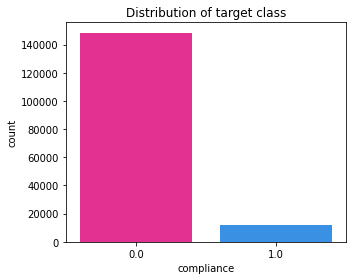

In [65]:
# Create just a figure and only one subplot
fig, ax = plt.subplots(figsize=(5,4))

colors=['deeppink','dodgerblue']
sns.countplot(x='compliance',data=train_data, palette=colors)

plt.title("Distribution of target class")
plt.ylabel("count")

plt.tight_layout()
plt.show()

There is a huge difference between the class of target variables. 148273 non-compliant transactions and 11595 compliant.
When there is a huge imbalance in target class, due to which classifier will always predict majority class. Though the accuracy is very high in such scenario, it is misleading.

We can use the dummy classifier to understand the performance of the actual data set with class imbalance

## <span style='color:Maroon'>Dummy classifier that classifies everything as the majority class of the training data</span>

In [66]:
# Simultaneously we will add the scores to a df for future reference

scores = pd.DataFrame(columns = ['Accuracy', 'Recall score', 'Precision score', 'F1 score', 'Specificity', 'AUC','TPR','FPR'])

In [67]:
#create a function to add rows
def add_row(scores, row):
    scores.loc[-1] = row
    scores.index = scores.index + 1
    return scores

In [68]:
from sklearn.dummy import DummyClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, recall_score, precision_score, roc_curve, auc, f1_score,roc_auc_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

In [69]:
# default is 75% / 25% train-test split
X = training_df.drop('compliance', axis=1)
y = training_df.compliance

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)

In [70]:
# use most frequent strategy always predicts '0'
dclf = DummyClassifier(strategy = 'most_frequent', random_state = 0)

dclf.fit(X_train, y_train)

#get predictions 
y_pred = dclf.predict(X_test)

# predict probabilities
y_probs = dclf.predict_proba(X_test)

# keep probabilities for the positive outcome only
y_probs = y_probs[:, 1]

# calculate roc curve
fpr_, tpr_, _ = roc_curve(y_test, y_probs)
#roc_auc_ = auc(fpr_, tpr_)

# calculate AUC
auc_ = roc_auc_score(y_test, y_probs)

#confusion matrix
cm=confusion_matrix(y_test,y_pred)

specificity_ = cm[0,0]/(cm[0,0]+cm[0,1]) #TN/(TN+FP)

Though the accuracy of the dummy classifier is very high, based on the recall and precision score we can understand that true positives is 0.

In [71]:
#append to df scores
add_row(scores, [accuracy_score(y_test, y_pred), recall_score(y_test, y_pred), precision_score(y_test, y_pred),
                 f1_score(y_test, y_pred), specificity_, auc_, tpr_, fpr_]);

# <span style='color:green'>Synthetic Minority Oversampling Technique (SMOTE)</span>

This technique generates synthetic data for the minority class.

SMOTE (Synthetic Minority Oversampling Technique) works by randomly picking a point from the minority class and computing the k-nearest neighbors for this point. The synthetic points are added between the chosen point and its neighbors.

In [72]:
## Resampling:
# import library
from imblearn.over_sampling import SMOTE

smote = SMOTE()

X = training_df.drop('compliance', axis=1)
y = training_df.compliance
# fit predictor and target variable
X_smote, y_smote = smote.fit_resample(X, y)

In [73]:
y_smote.value_counts()

0.0    148282
1.0    148282
Name: compliance, dtype: int64

the minority class is resampled, now the class imbalance is addressed and there are equal number of elements in both the classes

In [74]:
# Test train split
# default is 75% / 25% train-test split
X_train, X_test, y_train, y_test = train_test_split(X_smote, y_smote, random_state=0)

# <span style='color:Blue'>Model Building </span>

## <span style='color:Maroon'>Logistic Regression</span>

In [75]:
from sklearn.linear_model import LogisticRegression

log_reg_smote = LogisticRegression(max_iter=10000).fit(X_train, y_train)

#get predictions
y_pred = log_reg_smote.predict(X_test)

# predict probabilities
y_probs = log_reg_smote.predict_proba(X_test)

# keep probabilities for the positive outcome only
y_probs = y_probs[:, 1]

# calculate roc curve
fpr_, tpr_, _ = roc_curve(y_test, y_probs)

# calculate AUC
auc_ = roc_auc_score(y_test, y_probs)

#confusion matrix
cm=confusion_matrix(y_test,y_pred)

specificity_ = cm[0,0]/(cm[0,0]+cm[0,1]) #TN/(TN+FP)

In [76]:
#append to df scores
add_row(scores, [accuracy_score(y_test, y_pred), recall_score(y_test, y_pred), precision_score(y_test, y_pred),
                 f1_score(y_test, y_pred), specificity_, auc_, tpr_, fpr_]);

In [77]:
print("confusion matrix")
pd.crosstab(y_test, y_pred, rownames = ['Actual'], colnames =['Predicted'])

confusion matrix


Predicted,0.0,1.0
Actual,,
0.0,33142,4089
1.0,15263,21647


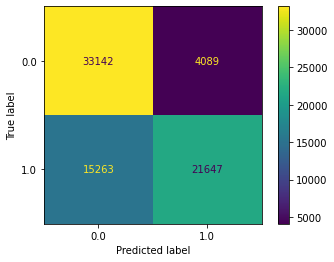

In [78]:
import matplotlib.pyplot as plt  
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(log_reg_smote, X_test, y_test)
plt.show()

## <span style='color:Maroon'>Gradient-boosted decision trees</span>

In [79]:
from sklearn.ensemble import GradientBoostingClassifier

GBC_D3_smote = GradientBoostingClassifier(random_state = 0)
GBC_D3_smote.fit(X_train, y_train)

#get predictions
y_pred = GBC_D3_smote.predict(X_test)

# predict probabilities
y_probs = GBC_D3_smote.predict_proba(X_test)

# keep probabilities for the positive outcome only
y_probs = y_probs[:, 1]

# calculate roc curve
fpr_, tpr_, _ = roc_curve(y_test, y_probs)

# calculate AUC
auc_ = roc_auc_score(y_test, y_probs)

#confusion matrix
cm=confusion_matrix(y_test,y_pred)

specificity_ = cm[0,0]/(cm[0,0]+cm[0,1]) #TN/(TN+FP)

In [80]:
#append to df scores
add_row(scores, [accuracy_score(y_test, y_pred), recall_score(y_test, y_pred), precision_score(y_test, y_pred),
                 f1_score(y_test, y_pred), specificity_, auc_, tpr_, fpr_]);

## <span style='color:Maroon'>Decision tree classifier</span>

In [81]:
from sklearn.tree import DecisionTreeClassifier

dtc_smote = DecisionTreeClassifier(max_depth=3).fit(X_train, y_train)

#get predictions
y_pred = dtc_smote.predict(X_test)

# predict probabilities
y_probs = dtc_smote.predict_proba(X_test)

# keep probabilities for the positive outcome only
y_probs = y_probs[:, 1]

# calculate roc curve
fpr_, tpr_, _ = roc_curve(y_test, y_probs)

# calculate AUC
auc_ = roc_auc_score(y_test, y_probs)

#confusion matrix
cm=confusion_matrix(y_test,y_pred)

specificity_ = cm[0,0]/(cm[0,0]+cm[0,1]) #TN/(TN+FP)

In [82]:
#append to df scores
add_row(scores, [accuracy_score(y_test, y_pred), recall_score(y_test, y_pred), precision_score(y_test, y_pred),
                 f1_score(y_test, y_pred), specificity_, auc_, tpr_, fpr_]);

## <span style='color:Maroon'>Random Forests</span>

In [83]:
from sklearn.ensemble import RandomForestClassifier

rf_smote = RandomForestClassifier(min_samples_split=100, max_depth=5, max_features = 8, random_state = 0).fit(X_train, y_train)

#get predictions
y_pred = rf_smote.predict(X_test)

# predict probabilities
y_probs = rf_smote.predict_proba(X_test)

# keep probabilities for the positive outcome only
y_probs = y_probs[:, 1]

# calculate roc curve
fpr_, tpr_, _ = roc_curve(y_test, y_probs)

# calculate AUC
auc_ = roc_auc_score(y_test, y_probs)

#confusion matrix
cm=confusion_matrix(y_test,y_pred)

specificity_ = cm[0,0]/(cm[0,0]+cm[0,1]) #TN/(TN+FP)

In [84]:
#append to df scores
add_row(scores, [accuracy_score(y_test, y_pred), recall_score(y_test, y_pred), precision_score(y_test, y_pred),
                 f1_score(y_test, y_pred), specificity_, auc_, tpr_, fpr_]);

## <span style='color:Maroon'>XG Boost Classifier</span>

In [85]:
from xgboost import XGBClassifier

xgb_smote = XGBClassifier(eval_metric='logloss').fit(X_train, y_train)

#get predictions
y_pred = xgb_smote.predict(X_test)

# predict probabilities
y_probs = xgb_smote.predict_proba(X_test)

# keep probabilities for the positive outcome only
y_probs = y_probs[:, 1]

# calculate roc curve
fpr_, tpr_, _ = roc_curve(y_test, y_probs)

# calculate AUC
auc_ = roc_auc_score(y_test, y_probs)

#confusion matrix
cm=confusion_matrix(y_test,y_pred)

specificity_ = cm[0,0]/(cm[0,0]+cm[0,1]) #TN/(TN+FP)

In [86]:
#append to df scores
add_row(scores, [accuracy_score(y_test, y_pred), recall_score(y_test, y_pred), precision_score(y_test, y_pred),
                 f1_score(y_test, y_pred), specificity_, auc_, tpr_, fpr_]);

## <span style='color:Maroon'>Logistic regression: Data Normalization</span>

In [87]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

X_train_scaled = scaler.fit_transform(X_smote)
X_train_norm, X_test_norm, y_train_norm, y_test_norm = train_test_split(X_train_scaled, y_smote, random_state=0)

log_norm_reg_smote = LogisticRegression(max_iter=10000).fit(X_train_norm, y_train_norm)

#get predictions
y_pred = log_norm_reg_smote.predict(X_test_norm)

# predict probabilities
y_probs = log_norm_reg_smote.predict_proba(X_test_norm)

# keep probabilities for the positive outcome only
y_probs = y_probs[:, 1]

# calculate roc curve
fpr_, tpr_, _ = roc_curve(y_test_norm, y_probs)

# calculate AUC
auc_ = roc_auc_score(y_test, y_probs)

#confusion matrix
cm=confusion_matrix(y_test,y_pred)

specificity_ = cm[0,0]/(cm[0,0]+cm[0,1]) #TN/(TN+FP)

In [88]:
#append to df scores
add_row(scores, [accuracy_score(y_test, y_pred), recall_score(y_test, y_pred), precision_score(y_test, y_pred),
                 f1_score(y_test, y_pred), specificity_, auc_, tpr_, fpr_]);

# <span style='color:green'>Random under-sampling with imblearn</span>

RandomUnderSampler is a fast and easy way to balance the data by randomly selecting a subset of data for the targeted classes. Under-sample the majority class(es) by randomly picking samples with or without replacement.


In [89]:
import imblearn
from imblearn.under_sampling import RandomUnderSampler

In [90]:
X = training_df.drop('compliance', axis=1)
y = training_df.compliance

# fit predictor and target variable
rus = RandomUnderSampler(random_state=0, replacement=True)# fit predictor and target variable
X_rus, y_rus = rus.fit_resample(X, y)

In [91]:
X_train, X_test, y_train, y_test = train_test_split(X_rus, y_rus, random_state=0)

In [92]:
y_rus.value_counts()

0.0    11597
1.0    11597
Name: compliance, dtype: int64

the majority class is resampled, now the class imbalance is addressed and there are equal number of elements in both the classes

## <span style='color:Maroon'>Logistic regression</span>


In [93]:
from sklearn.linear_model import LogisticRegression
# default is 75% / 25% train-test split

log_reg_rus = LogisticRegression(max_iter=10000).fit(X_train, y_train)

#get predictions
y_pred = log_reg_rus.predict(X_test)

# predict probabilities
y_probs = log_reg_rus.predict_proba(X_test)

# keep probabilities for the positive outcome only
y_probs = y_probs[:, 1]

# calculate roc curve
fpr_, tpr_, _ = roc_curve(y_test, y_probs)

# calculate AUC
auc_ = roc_auc_score(y_test, y_probs)

#confusion matrix
cm=confusion_matrix(y_test,y_pred)

specificity_ = cm[0,0]/(cm[0,0]+cm[0,1]) #TN/(TN+FP)

In [94]:
#append to df scores
add_row(scores, [accuracy_score(y_test, y_pred), recall_score(y_test, y_pred), precision_score(y_test, y_pred),
                 f1_score(y_test, y_pred), specificity_, auc_, tpr_, fpr_]);

## <span style='color:Maroon'>Gradient-boosted decision trees</span>

In [95]:
from sklearn.ensemble import GradientBoostingClassifier

GBC_D3_rus = GradientBoostingClassifier(random_state = 0)
GBC_D3_rus.fit(X_train, y_train)

#get predictions
y_pred = GBC_D3_rus.predict(X_test)

# predict probabilities
y_probs = GBC_D3_rus.predict_proba(X_test)

# keep probabilities for the positive outcome only
y_probs = y_probs[:, 1]

# calculate roc curve
fpr_, tpr_, _ = roc_curve(y_test, y_probs)

# calculate AUC
auc_ = roc_auc_score(y_test, y_probs)

#confusion matrix
cm=confusion_matrix(y_test,y_pred)

specificity_ = cm[0,0]/(cm[0,0]+cm[0,1]) #TN/(TN+FP)

In [96]:
#append to df scores
add_row(scores, [accuracy_score(y_test, y_pred), recall_score(y_test, y_pred), precision_score(y_test, y_pred),
                 f1_score(y_test, y_pred), specificity_, auc_, tpr_, fpr_]);

## <span style='color:Maroon'>Decision tree classifier</span>

In [97]:
from sklearn.tree import DecisionTreeClassifier

dtc_rus = DecisionTreeClassifier(max_depth=3).fit(X_train, y_train)

#get predictions
y_pred = dtc_rus.predict(X_test)

# predict probabilities
y_probs = dtc_rus.predict_proba(X_test)

# keep probabilities for the positive outcome only
y_probs = y_probs[:, 1]

# calculate roc curve
fpr_, tpr_, _ = roc_curve(y_test, y_probs)

# calculate AUC
auc_ = roc_auc_score(y_test, y_probs)

#confusion matrix
cm=confusion_matrix(y_test,y_pred)

specificity_ = cm[0,0]/(cm[0,0]+cm[0,1]) #TN/(TN+FP)

In [98]:
#append to df scores
add_row(scores, [accuracy_score(y_test, y_pred), recall_score(y_test, y_pred), precision_score(y_test, y_pred),
                 f1_score(y_test, y_pred), specificity_, auc_, tpr_, fpr_]);

## <span style='color:Maroon'>Random Forests</span>

In [99]:
from sklearn.ensemble import RandomForestClassifier

rf_rus = RandomForestClassifier(min_samples_split=100, max_depth=5, max_features = 8, random_state = 0).fit(X_train, y_train)

#get predictions
y_pred = rf_rus.predict(X_test)

# predict probabilities
y_probs = rf_rus.predict_proba(X_test)

# keep probabilities for the positive outcome only
y_probs = y_probs[:, 1]

# calculate roc curve
fpr_, tpr_, _ = roc_curve(y_test, y_probs)

# calculate AUC
auc_ = roc_auc_score(y_test, y_probs)

#confusion matrix
cm=confusion_matrix(y_test,y_pred)

specificity_ = cm[0,0]/(cm[0,0]+cm[0,1]) #TN/(TN+FP)

In [100]:
#append to df scores
add_row(scores, [accuracy_score(y_test, y_pred), recall_score(y_test, y_pred), precision_score(y_test, y_pred),
                 f1_score(y_test, y_pred), specificity_, auc_, tpr_, fpr_]);

## <span style='color:Maroon'>XG Boost Classifier</span>

In [101]:
from xgboost import XGBClassifier

xgb_rus = XGBClassifier(eval_metric='logloss').fit(X_train, y_train)

#get predictions
y_pred = xgb_rus.predict(X_test)

# predict probabilities
y_probs = xgb_rus.predict_proba(X_test)

# keep probabilities for the positive outcome only
y_probs = y_probs[:, 1]

# calculate roc curve
fpr_, tpr_, _ = roc_curve(y_test, y_probs)

# calculate AUC
auc_ = roc_auc_score(y_test, y_probs)

#confusion matrix
cm=confusion_matrix(y_test,y_pred)

specificity_ = cm[0,0]/(cm[0,0]+cm[0,1]) #TN/(TN+FP)

In [102]:
#append to df scores
add_row(scores, [accuracy_score(y_test, y_pred), recall_score(y_test, y_pred), precision_score(y_test, y_pred),
                 f1_score(y_test, y_pred), specificity_, auc_, tpr_, fpr_]);

## <span style='color:Maroon'>Logistic regression: Data Normalization</span>

In [103]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

X_train_scaled = scaler.fit_transform(X_rus)
X_train_norm, X_test_norm, y_train_norm, y_test_norm = train_test_split(X_train_scaled, y_rus, random_state=0)

log_norm_reg_rus = LogisticRegression(max_iter=10000).fit(X_train_norm, y_train_norm)

#get predictions
y_pred = log_norm_reg_rus.predict(X_test_norm)

# predict probabilities
y_probs = log_norm_reg_rus.predict_proba(X_test_norm)

# keep probabilities for the positive outcome only
y_probs = y_probs[:, 1]

# calculate roc curve
fpr_, tpr_, _ = roc_curve(y_test_norm, y_probs)

# calculate AUC
auc_ = roc_auc_score(y_test, y_probs)

#confusion matrix
cm=confusion_matrix(y_test,y_pred)

specificity_ = cm[0,0]/(cm[0,0]+cm[0,1]) #TN/(TN+FP)

In [104]:
#append to df scores
add_row(scores, [accuracy_score(y_test, y_pred), recall_score(y_test, y_pred), precision_score(y_test, y_pred),
                 f1_score(y_test, y_pred), specificity_, auc_, tpr_, fpr_]);

## <span style='color:Maroon'>Random Forest Classifier with ‘class_weight’ parameter </span>

Random Forrest Classifier has a parameter “class_weight” to specify the weights of each class in case of an imbalanced dataset.
In the sample dataset, class 0 is approx 13 times more prevalent than class 1. Hence, we will mention the “class weights” in such proportion for the algorithm to compensate during training.

In [105]:
X = training_df.drop('compliance', axis=1)
y = training_df.compliance

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)

In [106]:
from sklearn.ensemble import RandomForestClassifier

weighted_rf = RandomForestClassifier(min_samples_split=100, max_depth=5, random_state=0,class_weight={0:13, 1:1}).fit(X_train, y_train)

#get predictions
y_pred = weighted_rf.predict(X_test)

# predict probabilities
y_probs = weighted_rf.predict_proba(X_test)

# keep probabilities for the positive outcome only
y_probs = y_probs[:, 1]

# calculate roc curve
fpr_, tpr_, _ = roc_curve(y_test, y_probs)

# calculate AUC
auc_ = roc_auc_score(y_test, y_probs)

#confusion matrix
cm=confusion_matrix(y_test,y_pred)

specificity_ = cm[0,0]/(cm[0,0]+cm[0,1]) #TN/(TN+FP)

In [107]:
#append to df scores
add_row(scores, [accuracy_score(y_test, y_pred), recall_score(y_test, y_pred), precision_score(y_test, y_pred),
                 f1_score(y_test, y_pred), specificity_, auc_, tpr_, fpr_]);

## <span style='color:Maroon'>BalancedRandomForestClassifier in imbalanced-learn library </span>

A balanced random forest randomly under-samples each boostrap sample to balance it.



In [108]:
from imblearn.ensemble import BalancedRandomForestClassifier

brfc = BalancedRandomForestClassifier(min_samples_split=100, max_depth=5,n_estimators=200,random_state=0).fit(X_train,y_train)

#get predictions
y_pred = weighted_rf.predict(X_test)

# predict probabilities
y_probs = weighted_rf.predict_proba(X_test)

# keep probabilities for the positive outcome only
y_probs = y_probs[:, 1]

# calculate roc curve
fpr_, tpr_, _ = roc_curve(y_test, y_probs)

# calculate AUC
auc_ = roc_auc_score(y_test, y_probs)

#confusion matrix
cm=confusion_matrix(y_test,y_pred)

specificity_ = cm[0,0]/(cm[0,0]+cm[0,1]) #TN/(TN+FP)

In [109]:
#append to df scores
add_row(scores, [accuracy_score(y_test, y_pred), recall_score(y_test, y_pred), precision_score(y_test, y_pred),
                 f1_score(y_test, y_pred), specificity_, auc_, tpr_, fpr_]);

# <span style='color:Blue'>Model performance paramter comparison</span>


In [110]:
# Add the model names as column 
Model = ['Dummy Classifier', 'Logiestic Regression-SMOTE', 'Gradient Boost D3-SMOTE', 'Decision Tree-SMOTE',
         'Random Forest-SMOTE', 'XG Boost-SMOTE', 'Logistic Regression Normalised-SMOTE', 'Logiestic Regression-RUS',
         'Gradient Boost D3-RUS', 'Decision Tree-RUS', 'Random Forest-RUS', 'XG Boost-RUS',
         'Logistic Regression Normalised-RUS', 'Random Forest-CW', 'Random Forest-BRFC']
  
scores.insert(0, "Model", Model, True)

In [111]:
scores.sort_values(by='AUC', ascending=False, inplace=True)

In [112]:
scores.reset_index(drop=True, inplace=True)

In [113]:
scores

,Model,Accuracy,Recall score,Precision score,F1 score,Specificity,AUC,TPR,FPR
0,XG Boost-SMOTE,0.761697,0.661338,0.825276,0.734268,0.861191,0.838339,"[0.0, 2.70929287455974e-05, 0.0002709292874559...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
1,Gradient Boost D3-SMOTE,0.745269,0.634381,0.812851,0.712612,0.855201,0.813505,"[0.0, 2.70929287455974e-05, 5.41858574911948e-...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
2,Random Forest-SMOTE,0.741466,0.598998,0.835058,0.697599,0.882705,0.807333,"[0.0, 5.41858574911948e-05, 8.12787862367922e-...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
3,XG Boost-RUS,0.735472,0.620678,0.798652,0.698506,0.847411,0.798779,"[0.0, 0.0017464198393293748, 0.002444987775061...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
4,Logiestic Regression-SMOTE,0.738984,0.586481,0.841118,0.691090,0.890172,0.797036,"[0.0, 0.002492549444594961, 0.0025467353020861...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
5,Logistic Regression Normalised-SMOTE,0.738107,0.579220,0.846190,0.687704,0.895625,0.796266,"[0.0, 0.000135464643727987, 0.0003251151449471...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
6,Gradient Boost D3-RUS,0.729609,0.576668,0.822621,0.678029,0.878747,0.795219,"[0.0, 0.001047851903597625, 0.0013971358714634...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
7,Random Forest-RUS,0.730816,0.575271,0.826807,0.678476,0.882493,0.793759,"[0.0, 0.010478519035976248, 0.0220048899755501...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
8,Decision Tree-SMOTE,0.734182,0.570306,0.845449,0.681142,0.896645,0.787136,"[0.0, 0.06261175833107559, 0.09336223245732864...","[0.0, 0.00026859337648733585, 0.00042974940237..."
9,Random Forest-CW,0.931449,0.057527,0.976608,0.108653,0.999892,0.785195,"[0.0, 0.0003444712366517396, 0.001722356183258...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."


## <span style='color:Maroon'>plot model performance parameters </span>

In [114]:
cols=['AUC', 'Accuracy', 'Recall score', 'Precision score', 'Specificity', 'F1 score']
plot_data=scores[cols]

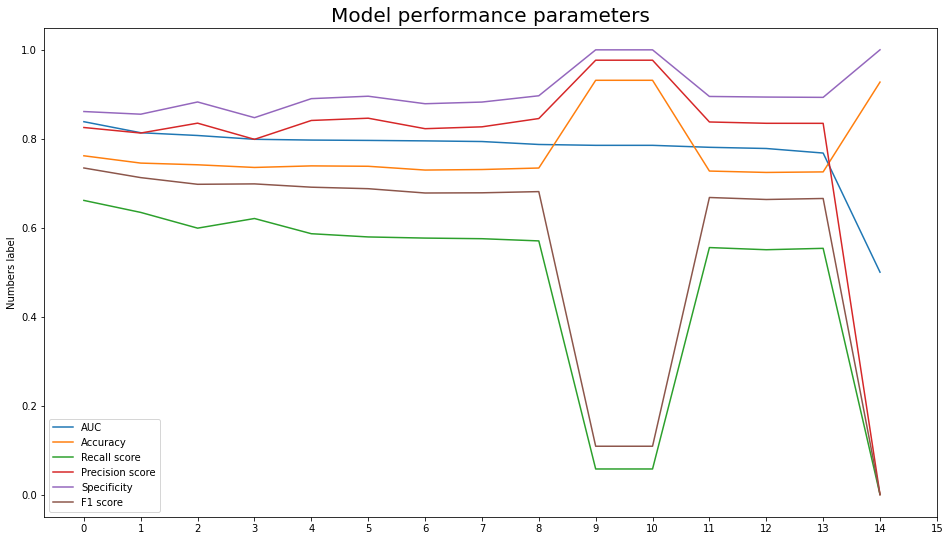

In [115]:
# Create just a figure and only one subplot
plt.figure(figsize = (16,9))

sns.lineplot(data=plot_data,dashes = False)
plt.title("Model performance parameters", fontsize = 20) # for title
# Adding label on the y-axis
plt.ylabel('Numbers label')

plt.xticks(np.arange(0, (len(plot_data)+1), 1))

plt.show() 

In [116]:
#scores.to_csv('model_scores.csv')


Based on the model performance scores, we can understand that XG Boost with Synthetic Minority Over-Sampling Technique has highest AUC of 0.85.
Also the model has an accuracy rate of 0.77. This is also one of the models with high recall of 0.68

We can use this model on our training dataset

# <span style='color:Blue'>get probability compliance for Test Data</span>


In [117]:
probability=xgb_smote.predict_proba(testing_df)[:,1]
# we need to select the probability that the ticket will be paid

In [118]:
final_result=pd.DataFrame({'ticket_id':test_ticketid['ticket_id'], 'probability':probability})

In [119]:
final_series=pd.Series(probability, index = test_ticketid['ticket_id'])


[!reference 1..](https://medium.com/analytics-vidhya/understanding-and-predicting-compliance-for-property-maintenance-fines-in-detroit-3585ee96a21b)<br>
[!reference 2..](http://www.dssgfellowship.org/wp-content/uploads/2017/09/cell.pdf)<br>
[!reference 3..](https://medium.com/analytics-vidhya/predict-whether-a-given-ticket-will-be-paid-2967ca93ec1c)<br>
[!reference 4..](https://fersuapin.medium.com/a-70-000-000-machine-learning-proyect-blight-violations-in-the-city-of-detroit-67d6c04ed440)

